# Gesture Recognition

In this group project, we have been given the set of sequential images and we are going to build a 3D Conv model that will be able to predict the 5 gestures namely,

- Thumbs up:  Increase the volume
- Thumbs down: Decrease the volume
- Left swipe: 'Jump' backwards 10 seconds
- Right swipe: 'Jump' forward 10 seconds  
- Stop: Pause the movie


In [1]:
# importing the necessary libraries to get started.

import numpy as np
import os
from skimage.transform import resize
import imageio
from imageio import imread
import datetime
import os
import glob
import matplotlib.pyplot as plt
import tensorflow_hub as hub


We set the random seed so that the results don't vary drastically.

In [2]:
np.random.seed(100)
import random as rn
rn.seed(100)
import tensorflow as tf
from tensorflow import keras
tf.random.set_seed(100)

In [3]:
#check whether GPU is available for TF

print(tf.test.is_gpu_available())

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
True


So we have been given training and validation datasets seperately. In this block, we read the folder names for training and validation. We also set the `batch_size` here. Note that we set the batch size in such a way that we are able to use the GPU in full capacity. We keep increasing the batch size until the machine throws an error.

## 1. Image Pre-Processing & Reshaping

In [4]:
train_doc = np.random.permutation(open('/home/kevin/Downloads/Project_data/train.csv').readlines())
val_doc = np.random.permutation(open('/home/kevin/Downloads/Project_data/val.csv').readlines())
batch_size = 10 #experiment with the batch size

Here we print with the images from each class of different video sequence. We pre-process them and see the results. Note that here we are not using all the 30 images for our model and instead using every 5th image only because of space restrictions. Our selection of number of images i.e. frame per video decides the time axis of our model.

### 1.1 Right Swipe sample image


WIN_20180907_15_35_09_Pro_00012.png


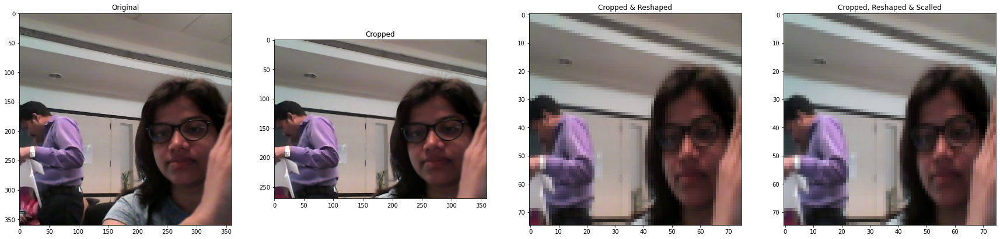

WIN_20180907_15_35_09_Pro_00022.png


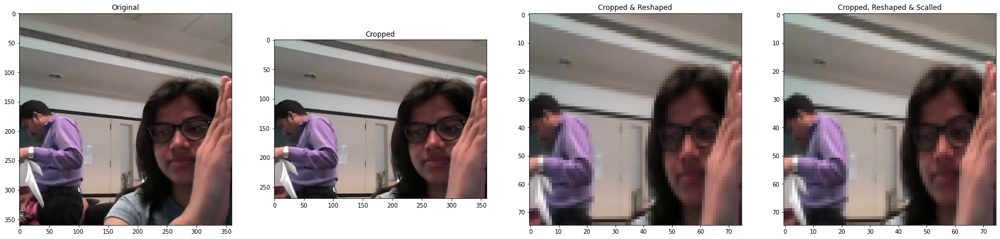

WIN_20180907_15_35_09_Pro_00032.png


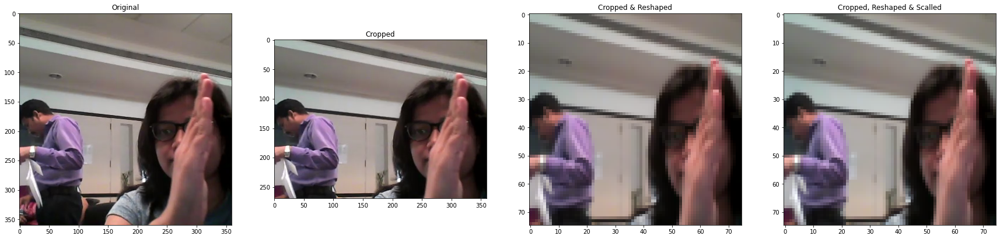

WIN_20180907_15_35_09_Pro_00042.png


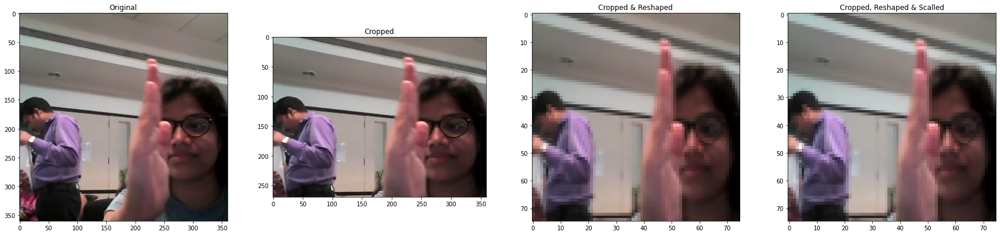

WIN_20180907_15_35_09_Pro_00052.png


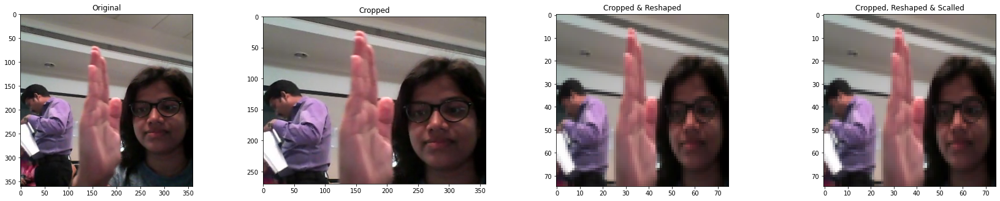

WIN_20180907_15_35_09_Pro_00062.png


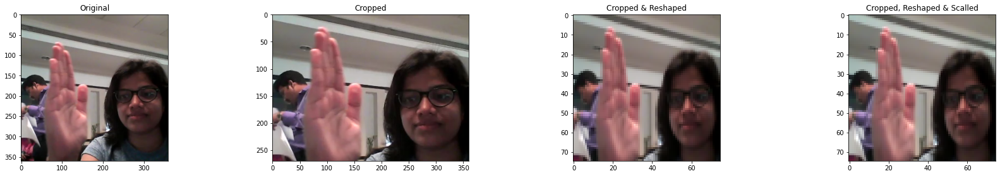

In [5]:
imgs = os.listdir('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new')


imgs=sorted(imgs)  # we sort the images to get the proper time sequence
print('')


j=1
for im in range(len(imgs)):
    print(imgs[im*5])
    plt.subplots(1,4,figsize=(30,30))
    i=imread('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/'+imgs[im*5])
    plt.subplot(j, 4, 1)
    plt.imshow(i)
    plt.title("Original")
    
    height, width = i.shape[0], i.shape[1]
                    
    #crop only the height of the image
    left = int(0)
    top = int(height/8)
    right = int(width)
    bottom = int(height - height/8)
    i = i[top:bottom, left:right]
    plt.subplot(j, 4, 2)
    plt.imshow(i)
    plt.title("Cropped")


    #resize the image 
    i = resize(i, (75,75))
    plt.subplot(j, 4, 3)
    plt.imshow(i)
    plt.title("Cropped & Reshaped")


    #channelwise normalize the image
    i = i.astype('float32')
    i[:,:,0] = (i[:,:,0]-i[:,:,0].min())/(i[:,:,0].max()-i[:,:,0].min())
    i[:,:,1] = (i[:,:,1]-i[:,:,1].min())/(i[:,:,1].max()-i[:,:,1].min())
    i[:,:,2] = (i[:,:,2]-i[:,:,2].min())/(i[:,:,2].max()-i[:,:,2].min())
    plt.subplot(j, 4, 4)
    plt.imshow(i)
    plt.title("Cropped, Reshaped & Scalled")
    plt.show()
    
    if j==6:
        break
    j+=1


### 1.2 Left Swipe sample image


WIN_20180907_15_38_17_Pro_00029.png


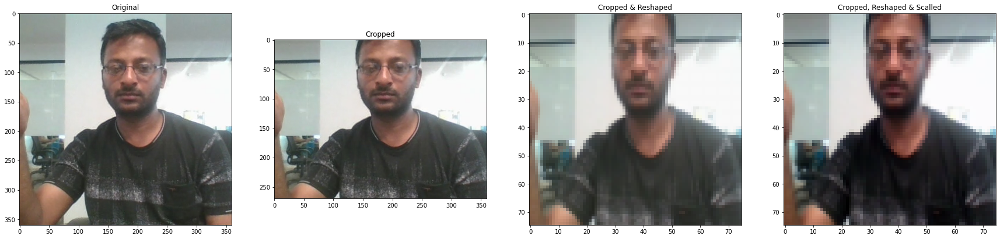

WIN_20180907_15_38_17_Pro_00039.png


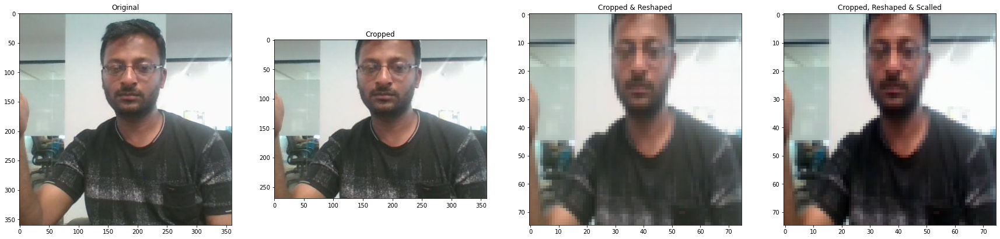

WIN_20180907_15_38_17_Pro_00049.png


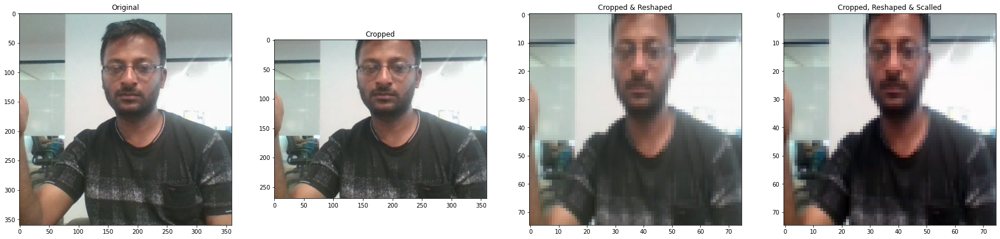

WIN_20180907_15_38_17_Pro_00059.png


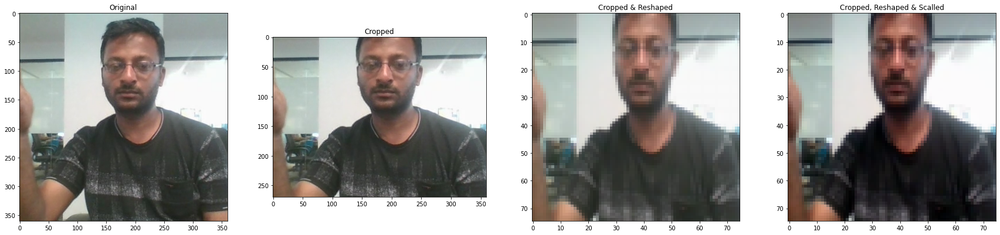

WIN_20180907_15_38_17_Pro_00069.png


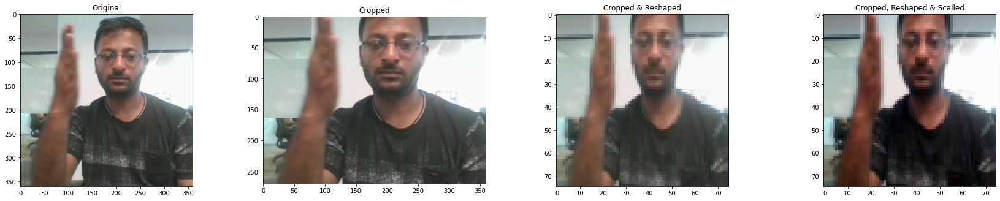

WIN_20180907_15_38_17_Pro_00079.png


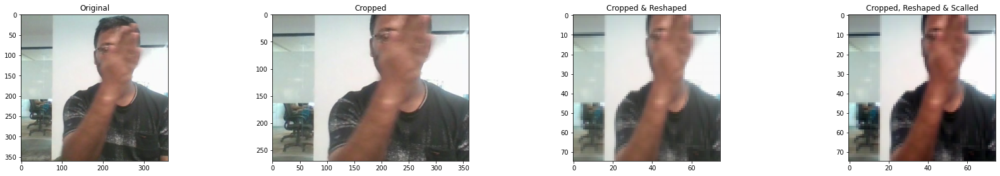

In [6]:
imgs = os.listdir('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new')

imgs=sorted(imgs)
print('')

j=1
for im in range(len(imgs)):
    print(imgs[im*5])
    plt.subplots(1,4,figsize=(30,30))
    i=imread('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/'+imgs[im*5])
    plt.subplot(j, 4, 1)
    plt.imshow(i)
    plt.title("Original")
    
    height, width = i.shape[0], i.shape[1]
                    
    #crop only the height of the image
    left = int(0)
    top = int(height/8)
    right = int(width)
    bottom = int(height - height/8)
    i = i[top:bottom, left:right]
    plt.subplot(j, 4, 2)
    plt.imshow(i)
    plt.title("Cropped")
    

    #resize the image 
    i = resize(i, (75,75))
    plt.subplot(j, 4, 3)
    plt.imshow(i)
    plt.title("Cropped & Reshaped")
    

    #channelwise normalize the image
    i = i.astype('float32')
    i[:,:,0] = (i[:,:,0]-i[:,:,0].min())/(i[:,:,0].max()-i[:,:,0].min())
    i[:,:,1] = (i[:,:,1]-i[:,:,1].min())/(i[:,:,1].max()-i[:,:,1].min())
    i[:,:,2] = (i[:,:,2]-i[:,:,2].min())/(i[:,:,2].max()-i[:,:,2].min())
    plt.subplot(j, 4, 4)
    plt.imshow(i)
    plt.title("Cropped, Reshaped & Scalled")
    plt.show()
    
    if j==6:
        break
    j+=1


### 1.3 Thumbs down sample image


WIN_20180907_15_38_35_Pro_00010.png


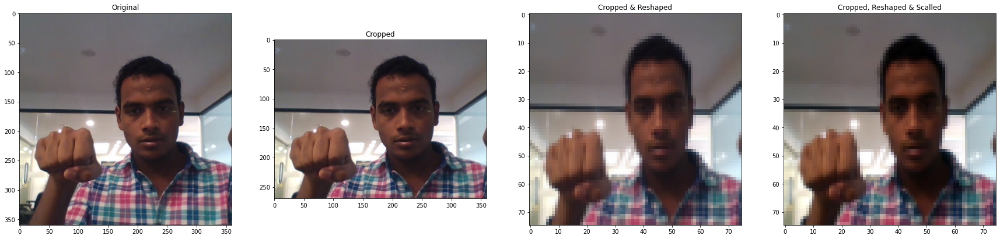

WIN_20180907_15_38_35_Pro_00020.png


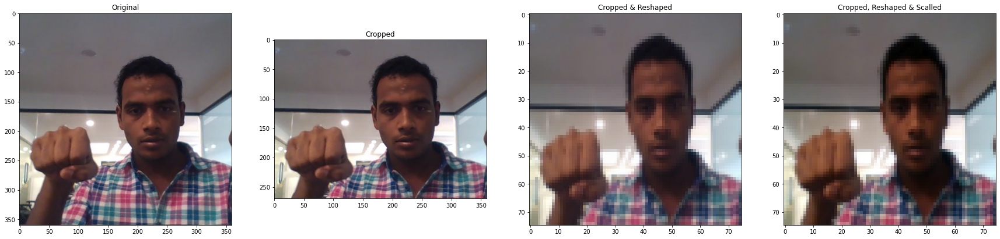

WIN_20180907_15_38_35_Pro_00030.png


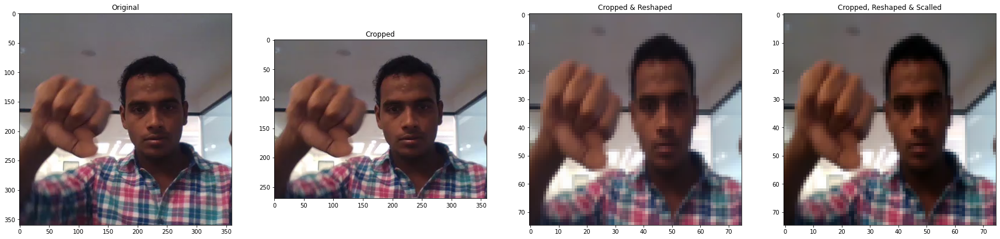

WIN_20180907_15_38_35_Pro_00040.png


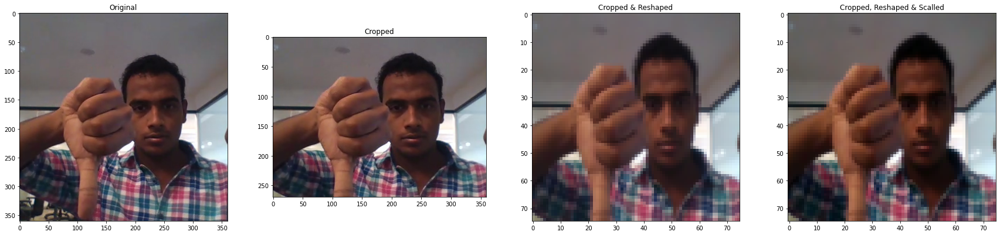

WIN_20180907_15_38_35_Pro_00050.png


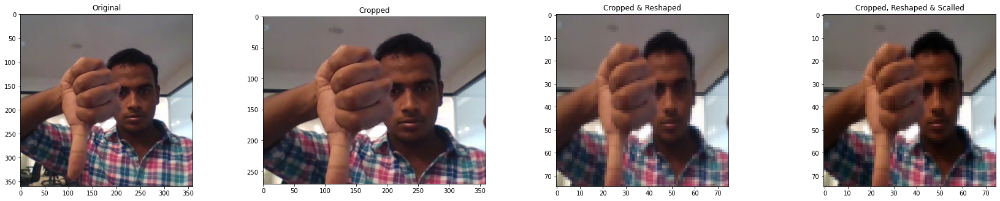

WIN_20180907_15_38_35_Pro_00060.png


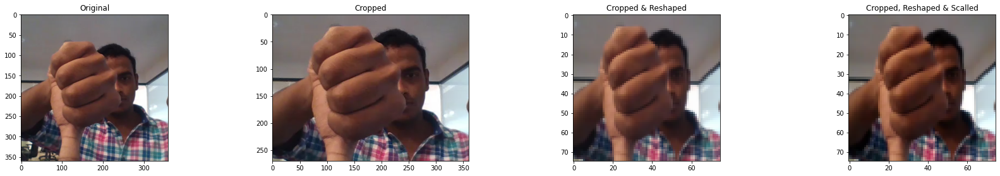

In [7]:
imgs = os.listdir('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_38_35_Pro_Thumbs Down_new')

imgs=sorted(imgs)
print('')

j=1
for im in range(len(imgs)):
    print(imgs[im*5])
    plt.subplots(1,4,figsize=(30,30))
    i=imread('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_38_35_Pro_Thumbs Down_new/'+imgs[im*5])
    plt.subplot(j, 4, 1)
    plt.imshow(i)
    plt.title("Original")
    
    height, width = i.shape[0], i.shape[1]
                    
    #crop only the height of the image
    left = int(0)
    top = int(height/8)
    right = int(width)
    bottom = int(height - height/8)
    i = i[top:bottom, left:right]
    plt.subplot(j, 4, 2)
    plt.imshow(i)
    plt.title("Cropped")
    

    #resize the image 
    i = resize(i, (75,75))
    plt.subplot(j, 4, 3)
    plt.imshow(i)
    plt.title("Cropped & Reshaped")
    

    #channelwise normalize the image
    i = i.astype('float32')
    i[:,:,0] = (i[:,:,0]-i[:,:,0].min())/(i[:,:,0].max()-i[:,:,0].min())
    i[:,:,1] = (i[:,:,1]-i[:,:,1].min())/(i[:,:,1].max()-i[:,:,1].min())
    i[:,:,2] = (i[:,:,2]-i[:,:,2].min())/(i[:,:,2].max()-i[:,:,2].min())
    plt.subplot(j, 4, 4)
    plt.imshow(i)
    plt.title("Cropped, Reshaped & Scalled")
    plt.show()
    
    if j==6:
        break
    j+=1


### 1.4 Thumbs up sample image


WIN_20180907_15_39_54_Pro_00007.png


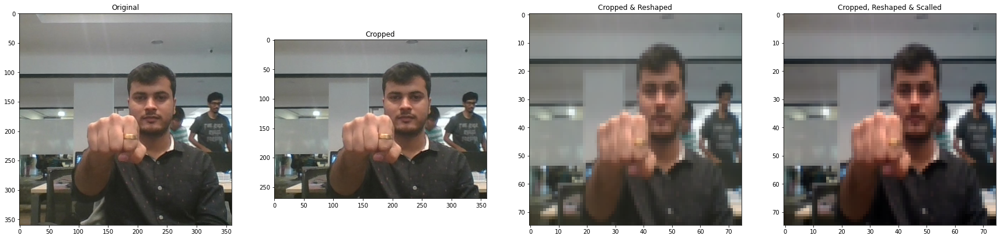

WIN_20180907_15_39_54_Pro_00017.png


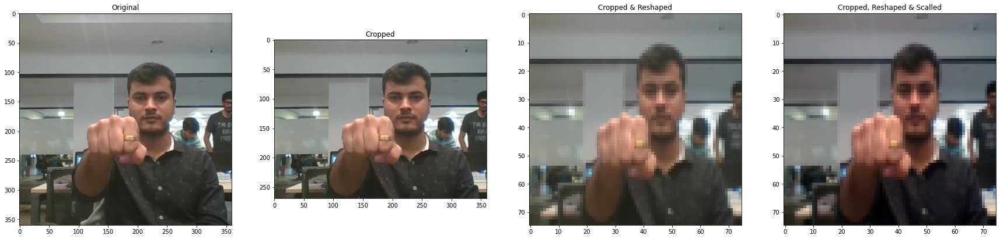

WIN_20180907_15_39_54_Pro_00027.png


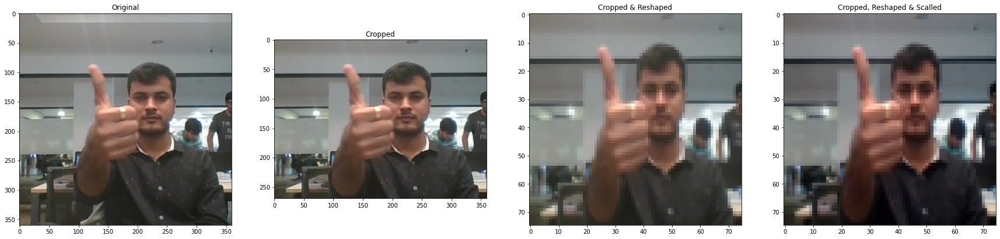

WIN_20180907_15_39_54_Pro_00037.png


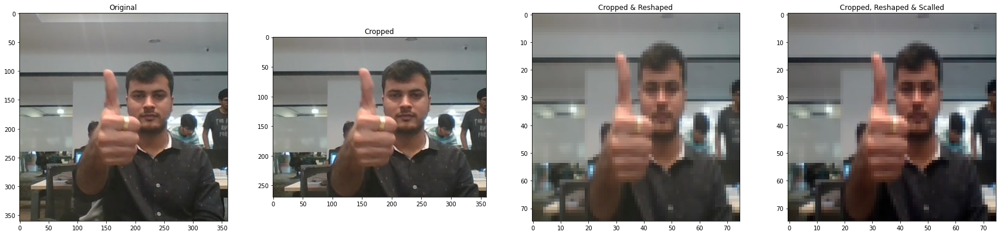

WIN_20180907_15_39_54_Pro_00047.png


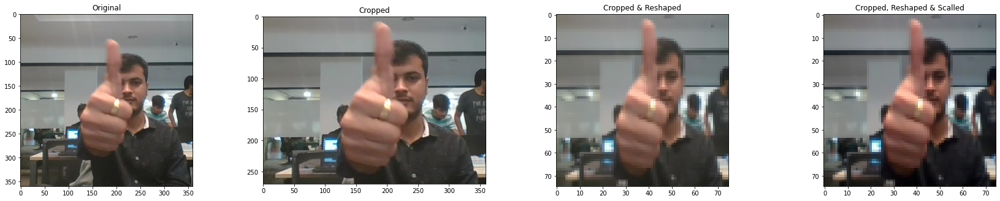

WIN_20180907_15_39_54_Pro_00057.png


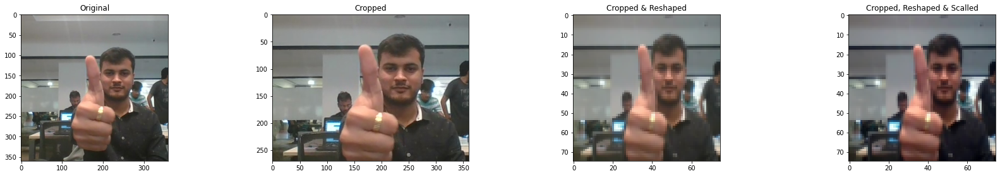

In [8]:
imgs = os.listdir('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_39_54_Pro_Thumbs Up_new')

imgs=sorted(imgs)
print('')

j=1
for im in range(len(imgs)):
    print(imgs[im*5])
    plt.subplots(1,4,figsize=(30,30))
    i=imread('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_39_54_Pro_Thumbs Up_new/'+imgs[im*5])
    plt.subplot(j, 4, 1)
    plt.imshow(i)
    plt.title("Original")
    
    height, width = i.shape[0], i.shape[1]
                    
    #crop only the height of the image
    left = int(0)
    top = int(height/8)
    right = int(width)
    bottom = int(height - height/8)
    i = i[top:bottom, left:right]
    plt.subplot(j, 4, 2)
    plt.imshow(i)
    plt.title("Cropped")
    

    #resize the image 
    i = resize(i, (75,75))
    plt.subplot(j, 4, 3)
    plt.imshow(i)
    plt.title("Cropped & Reshaped")
    

    #channelwise normalize the image
    i = i.astype('float32')
    i[:,:,0] = (i[:,:,0]-i[:,:,0].min())/(i[:,:,0].max()-i[:,:,0].min())
    i[:,:,1] = (i[:,:,1]-i[:,:,1].min())/(i[:,:,1].max()-i[:,:,1].min())
    i[:,:,2] = (i[:,:,2]-i[:,:,2].min())/(i[:,:,2].max()-i[:,:,2].min())
    plt.subplot(j, 4, 4)
    plt.imshow(i)
    plt.title("Cropped, Reshaped & Scalled")
    plt.show()
    
    if j==6:
        break
    j+=1


### 1.5 Stop sample image


WIN_20180907_15_39_51_Pro_00008.png


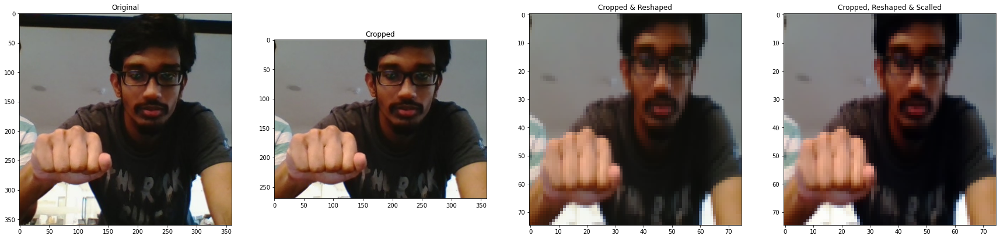

WIN_20180907_15_39_51_Pro_00018.png


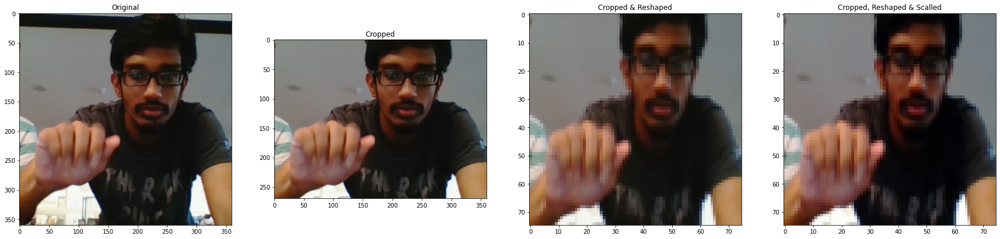

WIN_20180907_15_39_51_Pro_00028.png


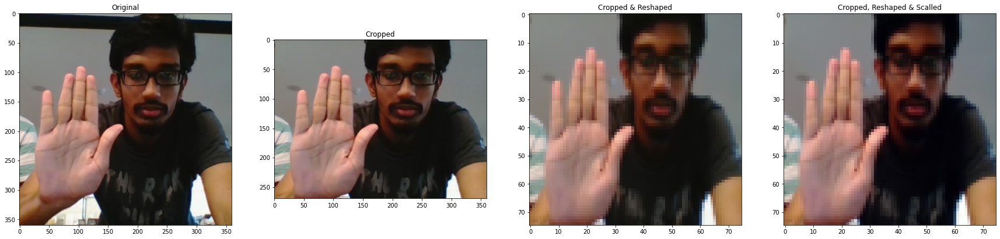

WIN_20180907_15_39_51_Pro_00038.png


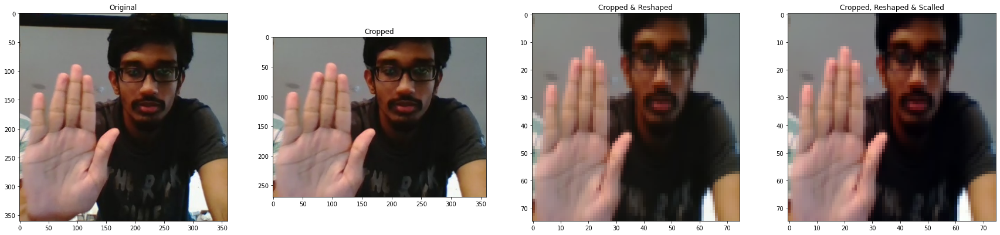

WIN_20180907_15_39_51_Pro_00048.png


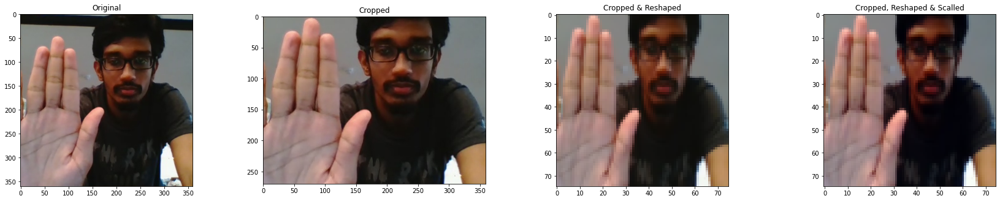

WIN_20180907_15_39_51_Pro_00058.png


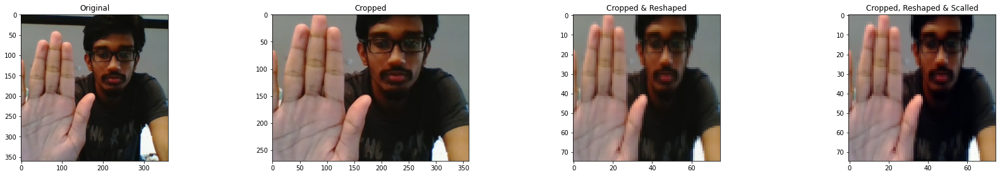

In [9]:
imgs = os.listdir('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_39_51_Pro_Stop Gesture_new')

imgs=sorted(imgs)
print('')

j=1
for im in range(len(imgs)):
    print(imgs[im*5])
    plt.subplots(1,4,figsize=(30,30))
    i=imread('/home/kevin/Downloads/Project_data/train/WIN_20180907_15_39_51_Pro_Stop Gesture_new/'+imgs[im*5])
    plt.subplot(j, 4, 1)
    plt.imshow(i)
    plt.title("Original")
    
    height, width = i.shape[0], i.shape[1]
                    
    #crop only the height of the image
    left = int(0)
    top = int(height/8)
    right = int(width)
    bottom = int(height - height/8)
    i = i[top:bottom, left:right]
    plt.subplot(j, 4, 2)
    plt.imshow(i)
    plt.title("Cropped")
    

    #resize the image 
    i = resize(i, (75,75))
    plt.subplot(j, 4, 3)
    plt.imshow(i)
    plt.title("Cropped & Reshaped")
    

    #channelwise normalize the image
    i = i.astype('float32')
    i[:,:,0] = (i[:,:,0]-i[:,:,0].min())/(i[:,:,0].max()-i[:,:,0].min())
    i[:,:,1] = (i[:,:,1]-i[:,:,1].min())/(i[:,:,1].max()-i[:,:,1].min())
    i[:,:,2] = (i[:,:,2]-i[:,:,2].min())/(i[:,:,2].max()-i[:,:,2].min())
    plt.subplot(j, 4, 4)
    plt.imshow(i)
    plt.title("Cropped, Reshaped & Scalled")
    plt.show()
    
    if j==6:
        break
    j+=1


The image pre-processing looks good. Let's now create a custom generator function and incorporate the above pre-processing steps.

## 2. Custom Generator building

In the generator, we are going to preprocess the images and also change dimensions as brought out above. Further, we will also create a batch of video frames. Here we will experiment with `img_idx` (no. of frames per video), `y` (width of frame), `z` (height of frame) and normalization such that we get high accuracy.

Here we do not crop the width of any images as our videos are such that gesture activities are mainly spanning the width region.

In [10]:
def generator(source_path, folder_list, batch_size):  
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    img_idx = np.arange(0, 30, 2)
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list)//batch_size
        for batch in range(num_batches): 
            batch_data = np.zeros((batch_size,len(img_idx),75,75,3)) 
            batch_labels = np.zeros((batch_size,5)) 
            for folder in range(batch_size): 
                imgs = sorted(os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0])) 
                for idx,item in enumerate(img_idx): 
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    # Crop
                    ima, imb, imc = image.shape
                    crop_image = image[0: ima , imb // 8: - imb // 8, :]

                    # resize
                    res_image = resize(crop_image, (75, 75))
                    
                    batch_data[folder,idx,:,:,0] = (res_image[:,:,0]-np.amin(res_image[:,:,0]))/(np.amax(res_image[:,:,0])-np.amin(res_image[:,:,0]))
                    batch_data[folder,idx,:,:,1] = (res_image[:,:,1]-np.amin(res_image[:,:,1]))/(np.amax(res_image[:,:,1])-np.amin(res_image[:,:,1]))
                    batch_data[folder,idx,:,:,2] = (res_image[:,:,2]-np.amin(res_image[:,:,2]))/(np.amax(res_image[:,:,2])-np.amin(res_image[:,:,2]))
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
            yield batch_data, batch_labels 
   
        # Remaining data batch
        if len(folder_list)%batch_size !=0:
            batch_size1 = len(folder_list)%batch_size
            for batch in range(num_batches, num_batches+1): 
                batch_data1 = np.zeros((batch_size1,len(img_idx),75,75,3)) 
                batch_labels1 = np.zeros((batch_size1,5)) 

                for folder in range(batch_size1): 
                    imgs = sorted(os.listdir(source_path+'/'+ t[folder + (batch*batch_size1)].split(';')[0])) 
                    for idx,item in enumerate(img_idx): 
                        image = imread(source_path+'/'+ t[folder + (batch*batch_size1)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)

                        # Crop
                        ima, imb, imc = image.shape
                        crop_image = image[0: ima, imb // 8: - imb // 8, :]
                        # resize
                        res_image = resize(crop_image, (75, 75))

                        batch_data1[folder,idx,:,:,0] = (res_image[:,:,0]-np.amin(res_image[:,:,0]))/(np.amax(res_image[:,:,0])-np.amin(res_image[:,:,0]))
                        batch_data1[folder,idx,:,:,1] = (res_image[:,:,1]-np.amin(res_image[:,:,1]))/(np.amax(res_image[:,:,1])-np.amin(res_image[:,:,1]))
                        batch_data1[folder,idx,:,:,2] = (res_image[:,:,2]-np.amin(res_image[:,:,2]))/(np.amax(res_image[:,:,2])-np.amin(res_image[:,:,2]))
                
                    batch_labels1[folder, int(t[folder + (batch*batch_size1)].strip().split(';')[2])] = 1

                yield batch_data1, batch_labels1

Note here that a video is represented above in the generator as (number of images, height, width, number of channels). We would have to take this into consideration while creating the model architecture.

In [11]:
curr_dt_time = datetime.datetime.now()
train_path = '/home/kevin/Downloads/Project_data/train'
val_path = '/home/kevin/Downloads/Project_data/val'
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
num_epochs = 15 # we choose the number of epochs
print ('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 15


## 3. Model building & training
Here we make the model using different functionalities that Keras provides. We use `TimeDistributed` while building a `Conv2D + GRU` model. We have to use last layer as the softmax with 05 classes. We design the network in such a way that the model is able to give good accuracy on the least number of parameters, so that it can fit in the memory of the webcam.

In [12]:
#final model

from tensorflow.keras import layers

num_classes = 5

model = tf.keras.Sequential([

layers.TimeDistributed(layers.Conv2D(8, (3, 3), padding='same', activation='relu')),
layers.TimeDistributed(layers.MaxPool2D()),
    
layers.TimeDistributed(layers.Conv2D(16, (3, 3), padding='same', activation='relu')),
layers.TimeDistributed(layers.MaxPool2D()),
                       
layers.TimeDistributed(layers.Conv2D(32, (3, 3), padding='same', activation='relu')),
layers.TimeDistributed(layers.MaxPool2D()),
    
layers.TimeDistributed(layers.Flatten()),
layers.Dropout(0.25),
    
layers.GRU(16,return_sequences=False),
layers.Dropout(0.25),
    
layers.Dense(num_classes, activation='softmax')
                       
])

Now that we have written the model, the next step is to `compile` the model. When we print the `summary` of the model, we see the total number of parameters we have to train.

In [13]:
optimiser = tf.keras.optimizers.Adam(learning_rate=0.001)  #write your optimizer
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

model.build([None, len(list(np.arange(0,30,2))), 75, 75, 3])

print (model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 15, 75, 75, 8)     224       
_________________________________________________________________
time_distributed_1 (TimeDist (None, 15, 37, 37, 8)     0         
_________________________________________________________________
time_distributed_2 (TimeDist (None, 15, 37, 37, 16)    1168      
_________________________________________________________________
time_distributed_3 (TimeDist (None, 15, 18, 18, 16)    0         
_________________________________________________________________
time_distributed_4 (TimeDist (None, 15, 18, 18, 32)    4640      
_________________________________________________________________
time_distributed_5 (TimeDist (None, 15, 9, 9, 32)      0         
_________________________________________________________________
time_distributed_6 (TimeDist (None, 15, 2592)          0

Let us now create the `train_generator` and the `val_generator` which will be used in `fit` class of keras.

In [14]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

Let's now define the model callbacks, for easy recovery (`checkpoint`) and reducing learning rate (`ReduceLROnPlateau`).

In [15]:
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss',
                             verbose=1, save_best_only=False, save_weights_only=False, 
                             mode='auto', period=1)  

LR =  tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

Let's define the `steps_per_epoch` and `validation_steps` which are used by `fit` class to decide the number of `next()` calls it need to make.

In [16]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

Let us now fit the model. This will start training the model and with the help of the checkpoints, we will be able to save the model at the end of each epoch.

In [17]:
history = model.fit(x=train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, 
                    verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1,
                    initial_epoch=0)

Source path =  /home/kevin/Downloads/Project_data/train ; batch size = 10
Epoch 1/15
67/67 [==============================] - 151s 2s/step - loss: 1.5765 - categorical_accuracy: 0.2549 - val_loss: 1.4518 - val_categorical_accuracy: 0.3900

Epoch 00001: saving model to model_init_2021-06-2220_42_34.947683/model-00001-1.57652-0.25490-1.45175-0.39000.h5
Epoch 2/15
67/67 [==============================] - 157s 2s/step - loss: 1.2794 - categorical_accuracy: 0.4600 - val_loss: 1.1707 - val_categorical_accuracy: 0.5900

Epoch 00002: saving model to model_init_2021-06-2220_42_34.947683/model-00002-1.27940-0.46003-1.17074-0.59000.h5
Epoch 3/15
67/67 [==============================] - 153s 2s/step - loss: 0.9716 - categorical_accuracy: 0.6410 - val_loss: 0.9798 - val_categorical_accuracy: 0.6800

Epoch 00003: saving model to model_init_2021-06-2220_42_34.947683/model-00003-0.97161-0.64103-0.97977-0.68000.h5
Epoch 4/15
67/67 [==============================] - 165s 3s/step - loss: 0.8364 - categor

## 4. Plotting the results

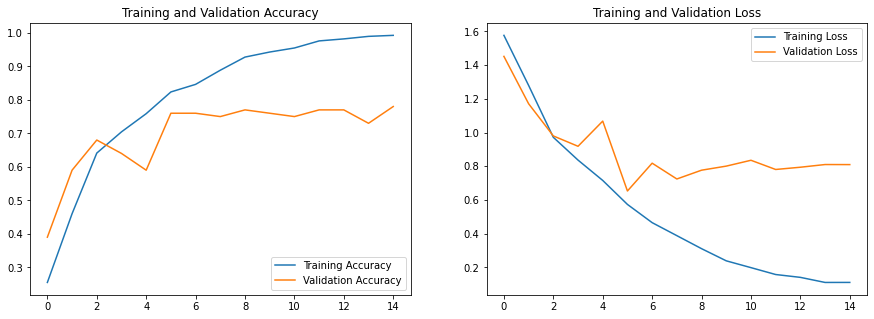

In [18]:
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(num_epochs)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()